# Possion Noise -- Hernquist Expansion Sampling

In [ ]:
r"""
    TITLE   : Sampling From a Hernquist potential
    PROJECT : discO
"""

__author__ = ["Nathaniel Starkman", "Christopher Carr"]
__version__ = "Oct 29, 2020"

<span style='font-size:30px;font-weight:650'>
    About
</span>

In this notebook we sample at different densities from a Hernquist sphere and show the errors in the SCF from poisson noise.

We use the:
- [ ] SCF method from Galpy
- [ ] SCF method in Gala (?)
- [ ] DiskSCF method in Galpy
- [ ] SCF method in AGAMA

Relevant Literature:
- A self-consistent field method for galactic dynamics


<br><br>

- - - 

## Prepare


### Imports

In [2]:
# BUILT-IN
import warnings

# THIRD PARTY
import astropy.coordinates as coord
import astropy.units as u
import galpy
import matplotlib.pyplot as plt
import numpy as np
from astropy.visualization import quantity_support
from galpy import df as gdf
from galpy import potential as gpot
from plotly import graph_objects as go

# PROJECT-SPECIFIC
from discO.utils.galpy import sample_df_in_frame
from discO.utils.pynbody import representation_to_pynbody_snapshot

In [3]:
quantity_support();

In [4]:
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings(
    "ignore",
    "The following kwargs were not used by contour",
    category=UserWarning,
)

<br><br>

- - - 

## Sampling with Galpy

First we set up the potential

In [5]:
mass = 1e12 * u.solMass
r0 = 10 * u.kpc  # scale factor

hernquist_pot = gpot.HernquistPotential(amp=mass, a=r0)

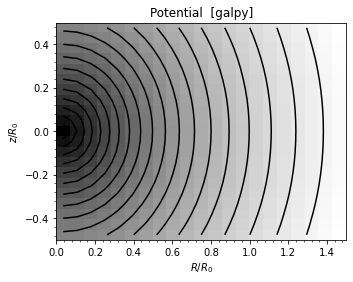

In [6]:
gpot.plotPotentials(hernquist_pot)
plt.title("Potential  [galpy]")
plt.show();

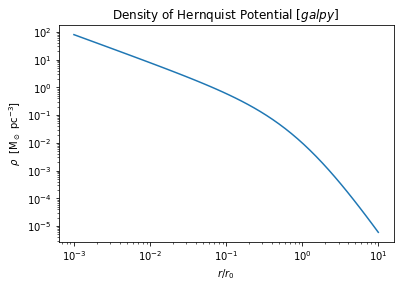

In [7]:
rs = np.geomspace(1e-2, 1e2, num=50) * u.kpc

fig = plt.figure()
ax = fig.add_subplot(
    111,
    title=r"Density of Hernquist Potential [$galpy$]",
    xlabel=r"$r/r_0$",
    ylabel=r"$\rho$  [M$_\odot$ pc$^{-3}$]",
    xscale="log",
    yscale="log",
)
ax.plot(rs / r0, hernquist_pot.dens(rs, z=0))

plt.show();

Now sampling from the potential

In [8]:
hernquist_df = gdf.isotropicHernquistdf(hernquist_pot)

hernquist_samples = sample_df_in_frame(
    hernquist_df, n=int(1e5), frame=coord.Galactocentric()
)
hernquist_samples[:5]

<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
    (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
    [( -1.19201404,   3.83227031,   4.30035202),
     ( -3.30322582, -64.42029513, -93.8386727 ),
     ( -9.17450744,   1.33735436,  12.58213457),
     (  2.03635879,   1.70706021,   1.92173463),
     (-14.54410979, -20.17439426,  10.16592449)]
 (v_x, v_y, v_z) in km / s
    [(-286.38259475, -101.31174815, -207.04686168),
     (  -1.29188918,   89.54830864,   37.37169595),
     ( -75.23754805,  -49.97590392,    5.16787885),
     (  75.35247695, -102.67486661,  -85.97125226),
     ( 156.77657558,  106.72400616, -180.32465807)]>

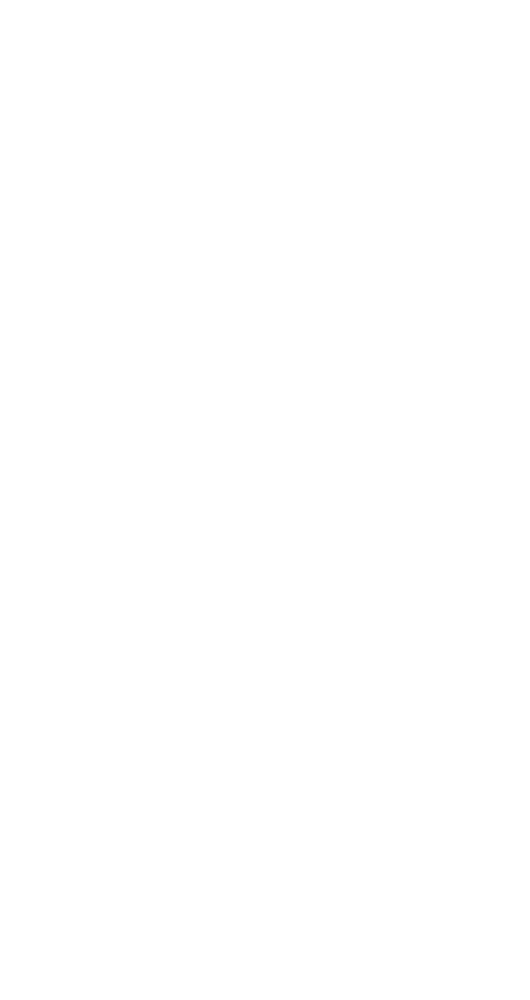

In [9]:
_sub = hernquist_samples[(hernquist_samples.icrs.distance < 250 * u.kpc)][::10]

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=_sub.x.to_value(u.pc),
            y=_sub.y.to_value(u.pc),
            z=_sub.z.to_value(u.pc),
            mode="markers",
            marker=dict(
                size=5, color=hernquist_samples.icrs.distance.to_value(u.kpc)
            ),
        )
    ]
)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
)

fig.show()

Reconstruct the potential from the sample


In [10]:
snap = representation_to_pynbody_snapshot(hernquist_samples)

sample_pot = gpot.SnapshotRZPotential(snap)
sample_pot

# ip = gpot.interpRZPotential(sample_pot, interpPot=True)  # WARNING! very slow to interpolate.

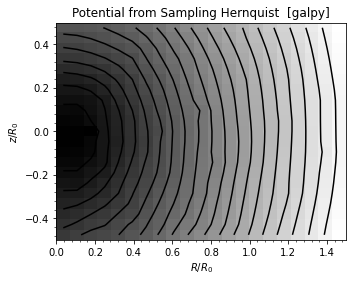

In [11]:
gpot.plotPotentials(sample_pot)
plt.title("Potential from Sampling Hernquist  [galpy]")
plt.show();

<br><br>

- - - 

## AGAMA

In [13]:
# THIRD PARTY
import agama

In [14]:
pot_Hern = agama.Potential(
    type="Spheroid",
    mass=1e12,
    scaleRadius=10,
    gamma=1,
    alpha=1,
    beta=4,
    cutoffStrength=0,
)  # Hernquist Potential

Text(0, 0.5, 'density [$M_{\\odot}$/kpc$^3$]')

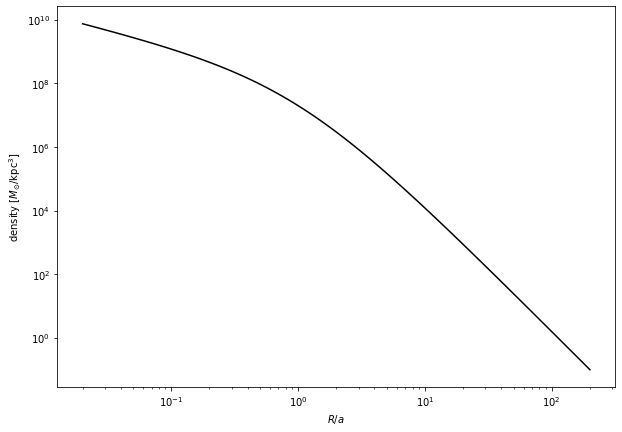

In [15]:
pos = np.zeros((3, 100)) * u.kpc
pos[0] = (
    np.logspace(np.log10(20.0 / 100.0), np.log10(20 * 100.0), pos.shape[1])
    * u.kpc
)
density = pot_Hern.density(pos.T)
pot = pot_Hern.potential(pos.T)
a = 10 * u.kpc

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
ax.plot(pos[0] / a, density, color="k")
ax.set_xlabel("$R/a$")
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_ylabel(r"density [$M_{\odot}$/kpc$^3$]")

In [18]:
snap = pot_Hern.sample(n=100000)
snap

(array([[ 17.10390409,   1.05972292,  10.98034477],
        [  1.77593711,  -1.03170387,   0.48382735],
        [-13.23800358,  -7.77223085,  -3.86008757],
        ...,
        [ 27.7196544 ,  54.27311463, -38.9244669 ],
        [-17.4925709 ,   0.43888178, -32.52871817],
        [ -5.60848435, -11.43228397,  -0.79632158]]),
 array([9980758.68697364, 9980758.68697364, 9980758.68697364, ...,
        9980758.68697364, 9980758.68697364, 9980758.68697364]))

In [ ]:
snap = pot_Hern.sample(100000)
R = np.sqrt(snap[0][:, 0] ** 2 + snap[0][:, 1] ** 2 + snap[0][:, 2] ** 2)
Hern_fit = agama.Potential(
    type="Multipole", particles=snap, symmetry="a", gridsizeR=20, lmax=2
)

density_fit = Hern_fit.density(snap[0])

fig, ax = plt.subplots(1, 1, figsize=(10, 7))
ax.scatter(R / a, density_fit, color="k")
ax.set_xlabel("$R/a$")
ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("$R/a$ [kpc]")
ax.set_ylabel(r"density [$M_{\odot}$/kpc$^3$]")

In [ ]:
# THIRD PARTY
from plotly import graph_objects as go

x = snap[0][:, 0] * u.kpc
y = snap[0][:, 1] * u.kpc
z = snap[0][:, 2] * u.kpc

fig = go.Figure(
    data=[go.Scatter3d(x=x, y=y, z=z, mode="markers", marker=dict(size=5))]
)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    margin=dict(l=50, r=50, b=100, t=100, pad=4),
)

<br><br>

- - - 

<span style='font-size:40px;font-weight:650'>
    END
</span>

```
@ARTICLE{2015ApJS..216...29B,
       author = {{Bovy}, Jo},
        title = "{galpy: A python Library for Galactic Dynamics}",
      journal = {\apjs},
     keywords = {galaxies: general, galaxies: kinematics and dynamics, Galaxy: fundamental parameters, Astrophysics - Astrophysics of Galaxies, Astrophysics - Instrumentation and Methods for Astrophysics},
         year = 2015,
        month = feb,
       volume = {216},
       number = {2},
          eid = {29},
        pages = {29},
          doi = {10.1088/0067-0049/216/2/29},
archivePrefix = {arXiv},
       eprint = {1412.3451},
 primaryClass = {astro-ph.GA},
       adsurl = {https://ui.adsabs.harvard.edu/abs/2015ApJS..216...29B},
      adsnote = {Provided by the SAO/NASA Astrophysics Data System}
}
```
```
@ARTICLE{2019MNRAS.482.1525V,
       author = {{Vasiliev}, Eugene},
        title = "{AGAMA: action-based galaxy modelling architecture}",
      journal = {\mnras},
     keywords = {methods: numerical, galaxies: kinematics and dynamics, Astrophysics - Astrophysics of Galaxies},
         year = 2019,
        month = jan,
       volume = {482},
       number = {2},
        pages = {1525-1544},
          doi = {10.1093/mnras/sty2672},
archivePrefix = {arXiv},
       eprint = {1802.08239},
 primaryClass = {astro-ph.GA},
       adsurl = {https://ui.adsabs.harvard.edu/abs/2019MNRAS.482.1525V},
      adsnote = {Provided by the SAO/NASA Astrophysics Data System}
}
```
For Agama Spheroid Potential

```
@ARTICLE{1996MNRAS.278..488Z,
       author = {{Zhao}, Hongsheng},
        title = "{Analytical models for galactic nuclei}",
      journal = {\mnras},
     keywords = {METHODS: ANALYTICAL, CELESTIAL MECHANICS, STELLAR DYNAMICS, GALAXIES: KINEMATICS AND DYNAMICS, GALAXIES: NUCLEI, Astrophysics},
         year = 1996,
        month = jan,
       volume = {278},
       number = {2},
        pages = {488-496},
          doi = {10.1093/mnras/278.2.488},
archivePrefix = {arXiv},
       eprint = {astro-ph/9509122},
 primaryClass = {astro-ph},
       adsurl = {https://ui.adsabs.harvard.edu/abs/1996MNRAS.278..488Z},
      adsnote = {Provided by the SAO/NASA Astrophysics Data System}
}
```

